In [1]:
# !unzip birds_dataset.zip

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import soundfile as sf
import sounddevice as sd
from IPython.display import Audio

In [3]:
df = pd.read_csv('small_birds_dataset/metadata.csv')
df.head()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,date,filename,license,rating,time,url,duration,split
0,azaspi1,[],['song'],8.7171,-71.33040,Synallaxis azarae,Azara's Spinetail,Joe Klaiber,0000-00-00,XC219896.wav,Creative Commons Attribution-NonCommercial-Sha...,5.0,00:00,https://www.xeno-canto.org/219896,9.682,train
1,azaspi1,[],['song'],-0.4400,-77.86240,Synallaxis azarae,Azara's Spinetail,GABRIEL LEITE,2014-07-11,XC186641.wav,Creative Commons Attribution-NonCommercial-Sha...,5.0,11:00,https://www.xeno-canto.org/186641,12.304,train
2,azaspi1,[],['song'],-17.1528,-65.90840,Synallaxis azarae,Azara's Spinetail,Sjoerd Mayer,1992-08-28,XC1596.wav,Creative Commons Attribution-NonCommercial-Sha...,5.0,?,https://www.xeno-canto.org/1596,12.862,train
3,azaspi1,[],['song'],-4.6476,-79.74426,Synallaxis azarae,Azara's Spinetail,Willem-Pier Vellinga,2000-07-00,XC746.wav,Creative Commons Attribution-NonCommercial-Sha...,4.5,?:?,https://www.xeno-canto.org/746,14.358,test
4,azaspi1,[],['song'],1.6564,-76.18300,Synallaxis azarae,Azara's Spinetail,David Bradley,2015-12-26,XC298616.wav,Creative Commons Attribution-NonCommercial-Sha...,5.0,06:00,https://www.xeno-canto.org/298616,14.780,train


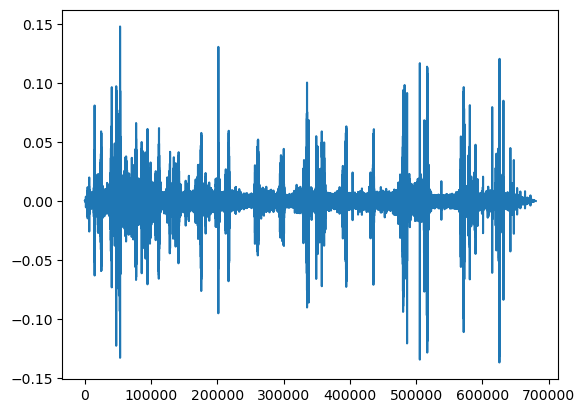

In [4]:
data , sr = sf.read('small_birds_dataset/train/azaspi1/XC155456.wav')
plt.plot(data)
Audio(data , rate= sr)

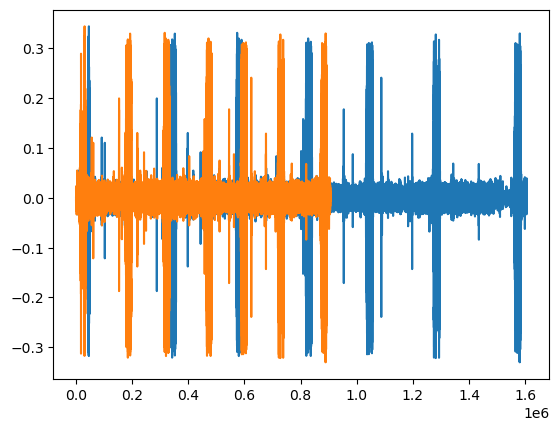

In [5]:
data , sr = sf.read('small_birds_dataset/train/chcant2/XC118040.wav')
plt.plot(data)
modified_array = np.where(np.logical_and(data >= -0.005,data <= 0.005), 0, data)
modified_array = modified_array[modified_array != 0]
plt.plot(modified_array)
Audio(modified_array , rate= sr)
# Audio(data , rate= sr)

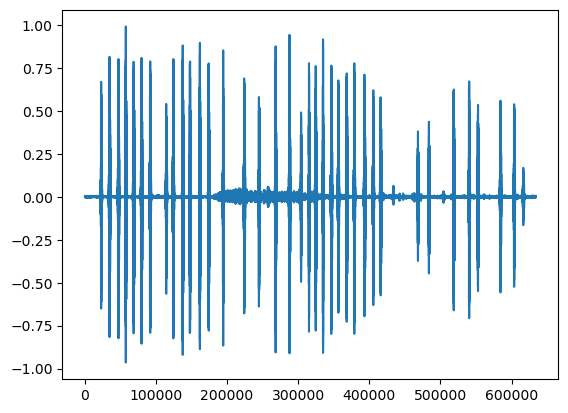

In [6]:
data , sr = sf.read('small_birds_dataset/train/houspa/XC116041.wav')
plt.plot(data)
Audio(data , rate= sr)

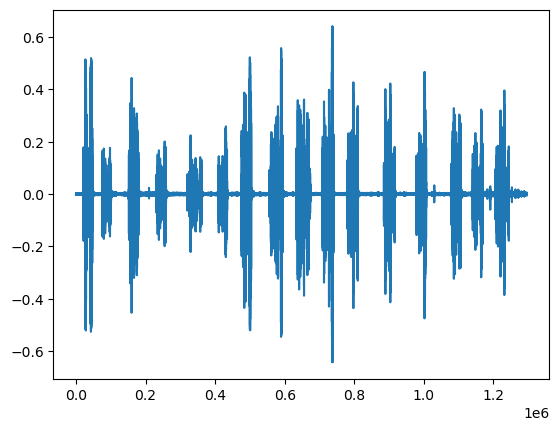

In [7]:
data , sr = sf.read('small_birds_dataset/train/redcro/XC143212.wav')
plt.plot(data)
Audio(data , rate= sr)

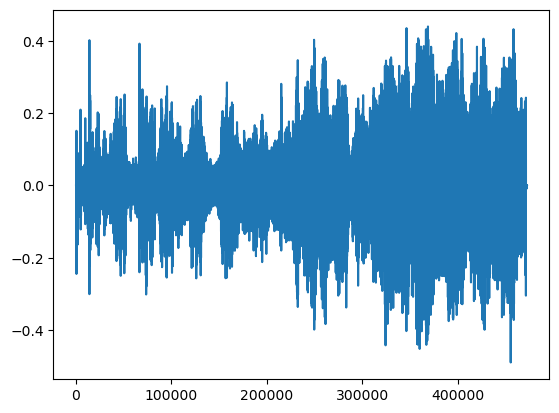

In [8]:
data , sr = sf.read('small_birds_dataset/train/wbwwre1/XC10572.wav')
plt.plot(data)
Audio(data , rate= sr)

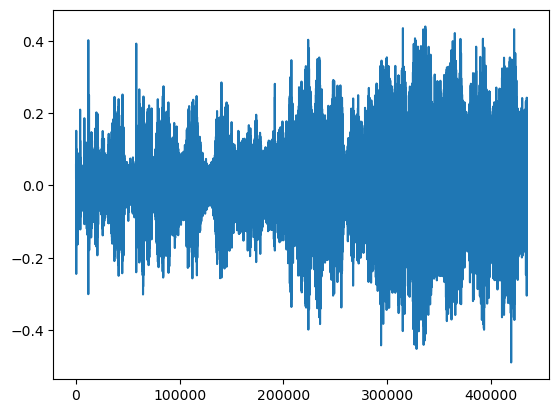

In [9]:
modified_array = np.where(np.logical_and(data >= -0.005,data <= 0.005), 0, data)
modified_array = modified_array[modified_array != 0]
plt.plot(modified_array)
Audio(modified_array , rate= sr)

In [10]:
import librosa
import librosa.display
def features_extractor(file):
    audio, sample_rate = librosa.load(file) 
    modified_array = np.where(np.logical_and(audio >= -0.005,audio <= 0.005), 0, audio)
    modified_array = modified_array[modified_array != 0]
    mfccs_features = librosa.feature.mfcc(y=modified_array, sr=sample_rate, n_mfcc=50)
    mfccs_scaled_features = np.mean(mfccs_features.T,axis=0)
    return mfccs_scaled_features

In [11]:
%%time
import os
import numpy as np
import pandas as pd
from scipy.io import wavfile
from scipy.signal import spectrogram
import matplotlib.pyplot as plt
res = []
clss = []
mfcc = []
count = 0
data_folder = 'small_birds_dataset/train'
for path in os.listdir(data_folder):
    print(path)
    if os.path.isfile(os.path.join(data_folder, path)):
        res.append(path)
        clss.append(path)
    else:
        for i in os.listdir(data_folder+'/'+path):
            if os.path.isfile(os.path.join(data_folder+'/'+path, i)):
                try:
                    val = os.path.join(data_folder+'/'+path+'/',i)
                    c = path
                    res.append(val)
                    clss.append(c)
                    Features = features_extractor(val).tolist()
                    mfcc.append(Features)
                    count += 1
                except Exception as e:
                    mfcc.append(None) 
print('Path:',len(res),'class:',len(clss),'mfcc:',len(mfcc))
            
df = pd.DataFrame({'Path':res,'Class':clss,'Features':mfcc})
df.head()

houspa
chcant2
redcro
wbwwre1
azaspi1
Path: 241 class: 241 mfcc: 241
CPU times: user 32.1 s, sys: 563 ms, total: 32.6 s
Wall time: 9.6 s


,Path,Class,Features
0,small_birds_dataset/train/houspa/XC547014.wav,houspa,"[-179.63232421875, 14.373997688293457, -18.545..."
1,small_birds_dataset/train/houspa/XC550004.wav,houspa,"[-257.8770446777344, -88.5504379272461, -12.24..."
2,small_birds_dataset/train/houspa/XC513501.wav,houspa,"[-196.0828094482422, -32.92329788208008, -30.0..."
3,small_birds_dataset/train/houspa/XC116041.wav,houspa,"[-227.91567993164062, -81.94418334960938, -54...."
4,small_birds_dataset/train/houspa/XC530808.wav,houspa,"[-259.7026062011719, -103.2078628540039, -35.3..."


In [12]:
df.to_csv('data/train.csv',index = False)

In [13]:
%%time
import os
import numpy as np
import pandas as pd
from scipy.io import wavfile
from scipy.signal import spectrogram
import matplotlib.pyplot as plt
res = []
clss = []
mfcc = []
count = 0
data_folder = 'small_birds_dataset/test'
for path in os.listdir(data_folder):
    if os.path.isfile(os.path.join(data_folder, path)):
        res.append(path)
        clss.append(path)
    else:
        for i in os.listdir(data_folder+'/'+path):
            if os.path.isfile(os.path.join(data_folder+'/'+path, i)):
                try:
                    val = os.path.join(data_folder+'/'+path+'/',i)
                    c = path
                    res.append(val)
                    clss.append(c)
                    Features = features_extractor(val).tolist()
                    mfcc.append(Features)
                    count += 1
                except Exception as e:
                    mfcc.append(None) 
print('Path:',len(res),'class:',len(clss),'mfcc:',len(mfcc))   
df = pd.DataFrame({'Path':res,'Class':clss,'Features':mfcc})
df.to_csv('data/test.csv',index = False)

Path: 53 class: 53 mfcc: 53
CPU times: user 6.81 s, sys: 76 ms, total: 6.89 s
Wall time: 1.77 s


In [14]:
import ast
df = pd.read_csv('data/train.csv')
df1 = df.drop(['Path'],axis=1)
df1['Features'] = df1['Features'].apply(ast.literal_eval)
dataset = pd.DataFrame(index=df1.index, columns=[f'Feature{i+1}' for i in range(50)])
for i in range(50):
    dataset[f'Feature{i+1}'] = df1['Features'].apply(lambda x: x[i] if i < len(x) else None)
dataset['class'] = df1['Class']

In [15]:
clss = np.array(['houspa', 'chcant2', 'redcro', 'wbwwre1', 'azaspi1'])

n = dataset['class'].nunique()
value = [i for i in range (0,n)]
dataset['class'] = dataset['class'].replace(clss,value)

In [16]:
from sklearn.model_selection import train_test_split
X = dataset.drop('class', axis=1)
y = dataset['class']
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.1, random_state=42
)

In [17]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Training the classification using Tensorflow

In [143]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

# Example data
y_train_one_hot = to_categorical(y_train, num_classes=5)

model = Sequential()
# model.add(Dense(128, input_dim=50, activation='tanh'))
model.add(Dense(64,input_dim=50,activation='tanh'))
model.add(Dense(32,activation='relu'))
model.add(Dense(5, activation='softmax'))  

model.compile(optimizer=Adam(), loss=CategoricalCrossentropy(), metrics=['accuracy'])

# Train the model
model.fit(X_train_scaled, y_train_one_hot, epochs=100, batch_size=16)

predictions = model.predict(X_test_scaled)
predicted_labels = tf.argmax(predictions, axis=1)
model.save('speech.h5')
print("Predictions:")
print(predicted_labels.numpy())


Epoch 1/100
14/14 [==============================] - 0s 3ms/step - loss: 1.7002 - accuracy: 0.2083
Epoch 2/100
14/14 [==============================] - 0s 2ms/step - loss: 1.4356 - accuracy: 0.4028
Epoch 3/100
14/14 [==============================] - 0s 4ms/step - loss: 1.2755 - accuracy: 0.5139
Epoch 4/100
14/14 [==============================] - 0s 2ms/step - loss: 1.1563 - accuracy: 0.5694
Epoch 5/100
14/14 [==============================] - 0s 2ms/step - loss: 1.0547 - accuracy: 0.6481
Epoch 6/100
14/14 [==============================] - 0s 1ms/step - loss: 0.9673 - accuracy: 0.6944
Epoch 7/100
14/14 [==============================] - 0s 3ms/step - loss: 0.8957 - accuracy: 0.7315
Epoch 8/100
14/14 [==============================] - 0s 2ms/step - loss: 0.8306 - accuracy: 0.7593
Epoch 9/100
14/14 [==============================] - 0s 2ms/step - loss: 0.7738 - accuracy: 0.7917
Epoch 10/100
14/14 [==============================] - 0s 2ms/step - loss: 0.7227 - accuracy: 0.7870
Epoch 11/

14/14 [==============================] - 0s 1ms/step - loss: 0.0219 - accuracy: 1.0000
Epoch 84/100
14/14 [==============================] - 0s 2ms/step - loss: 0.0210 - accuracy: 1.0000
Epoch 85/100
14/14 [==============================] - 0s 2ms/step - loss: 0.0205 - accuracy: 1.0000
Epoch 86/100
14/14 [==============================] - 0s 2ms/step - loss: 0.0198 - accuracy: 1.0000
Epoch 87/100
14/14 [==============================] - 0s 2ms/step - loss: 0.0194 - accuracy: 1.0000
Epoch 88/100
14/14 [==============================] - 0s 1ms/step - loss: 0.0183 - accuracy: 1.0000
Epoch 89/100
14/14 [==============================] - 0s 1ms/step - loss: 0.0180 - accuracy: 1.0000
Epoch 90/100
14/14 [==============================] - 0s 2ms/step - loss: 0.0173 - accuracy: 1.0000
Epoch 91/100
14/14 [==============================] - 0s 2ms/step - loss: 0.0170 - accuracy: 1.0000
Epoch 92/100
14/14 [==============================] - 0s 3ms/step - loss: 0.0164 - accuracy: 1.0000
Epoch 93/100


In [144]:
list(y_test) , list(predicted_labels.numpy())

([0, 0, 4, 4, 4, 3, 3, 4, 0, 2, 0, 4, 4, 4, 1, 3, 3, 0, 1, 2, 0, 0, 2, 0, 3],
 [0, 0, 4, 2, 3, 3, 0, 2, 0, 2, 0, 3, 4, 4, 1, 3, 3, 0, 1, 0, 0, 4, 0, 0, 3])

In [145]:
loaded_model = tf.keras.models.load_model('speech.h5')

In [146]:
loaded_model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_21 (Dense)            (None, 64)                3264      
                                                                 
 dense_22 (Dense)            (None, 32)                2080      
                                                                 
 dense_23 (Dense)            (None, 5)                 165       
                                                                 
Total params: 5,509
Trainable params: 5,509
Non-trainable params: 0
_________________________________________________________________


In [147]:
df = pd.read_csv('data/test.csv')
df1 = df.drop(['Path'],axis=1)
df1['Features'] = df1['Features'].apply(ast.literal_eval)
test = pd.DataFrame(index=df1.index, columns=[f'Feature{i+1}' for i in range(50)])
for i in range(50):
    test[f'Feature{i+1}'] = df1['Features'].apply(lambda x: x[i] if i < len(x) else None)
test['class'] = df1['Class']
value = [i for i in range (0,n)]
test['class'] = test['class'].replace(clss,value)

In [148]:
from sklearn.preprocessing import StandardScaler
X_test = test.drop(['class'],axis=1)
scaler = StandardScaler()
X_test = scaler.fit_transform(X_test)

In [149]:
predictions = model.predict(X_test)
predicted_labels = tf.argmax(predictions, axis=1)

print("Predictions:")
print(predicted_labels.numpy())
k = predicted_labels.numpy()

2/2 [==============================] - 0s 9ms/step
Predictions:
[0 0 0 3 0 0 0 4 2 0 4 1 4 1 1 1 1 4 1 1 1 2 3 2 3 3 2 3 3 1 2 2 3 3 3 3 2
 3 2 3 4 0 4 3 4 4 3 4 4 3 3 3 0]


In [150]:
l = list(test['class'])
write = 0
wrong = 0
for i in range(0,len(l)):
    if l[i] == k[i]:
        write += 1
    else:
        wrong += 1


In [151]:
(write)/len(l)
# df.shape

0.6037735849056604

In [152]:
# pd.concat(,axis=1)
df = pd.concat([dataset,test], ignore_index=True)
train = df.drop(['class'],axis=1)
y = df['class']

In [153]:
TF_LITE_MODEL_QUANT_MODEL = 'speech_recog.tflite'

In [154]:
tf_lite_converter = tf.lite.TFLiteConverter.from_keras_model(model)
tf_lite_converter.optimizations = [tf.lite.Optimize.OPTIMIZE_FOR_SIZE]
tflite_model = tf_lite_converter.convert()

INFO:tensorflow:Assets written to: /tmp/tmpef5p0d8p/assets


INFO:tensorflow:Assets written to: /tmp/tmpef5p0d8p/assets
2024-01-25 13:19:38.899544: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:364] Ignored output_format.
2024-01-25 13:19:38.899573: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:367] Ignored drop_control_dependency.
2024-01-25 13:19:38.899723: I tensorflow/cc/saved_model/reader.cc:45] Reading SavedModel from: /tmp/tmpef5p0d8p
2024-01-25 13:19:38.900381: I tensorflow/cc/saved_model/reader.cc:89] Reading meta graph with tags { serve }
2024-01-25 13:19:38.900404: I tensorflow/cc/saved_model/reader.cc:130] Reading SavedModel debug info (if present) from: /tmp/tmpef5p0d8p
2024-01-25 13:19:38.902514: I tensorflow/cc/saved_model/loader.cc:231] Restoring SavedModel bundle.
2024-01-25 13:19:38.927765: I tensorflow/cc/saved_model/loader.cc:215] Running initialization op on SavedModel bundle at path: /tmp/tmpef5p0d8p
2024-01-25 13:19:38.933985: I tensorflow/cc/saved_model/loader.cc:314] SavedModel

In [155]:
tflite_model_name = TF_LITE_MODEL_QUANT_MODEL
open(tflite_model_name, "wb").write(tflite_model)

8720

In [156]:
interpreter = tf.lite.Interpreter(model_path=TF_LITE_MODEL_QUANT_MODEL)
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

In [157]:
print("Input Shape: ", input_details[0]['shape'])
print("Input Type: ", input_details[0]['dtype'])
print("Output Shape: ", output_details[0]['shape'])
print("Output Shape: ", output_details[0]['dtype'])

Input Shape:  [ 1 50]
Input Type:  <class 'numpy.float32'>
Output Shape:  [1 5]
Output Shape:  <class 'numpy.float32'>


In [158]:
interpreter.resize_tensor_input(input_details[0]['index'], (25, 50))
interpreter.resize_tensor_input(output_details[0]['index'], (64, 100))
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
print("Input Shape: ", input_details[0]['shape'])
print("Input Type: ", input_details[0]['dtype'])
print("Output Shape: ", output_details[0]['shape'])
print("Output Shape: ", output_details[0]['dtype'])

Input Shape:  [25 50]
Input Type:  <class 'numpy.float32'>
Output Shape:  [25  5]
Output Shape:  <class 'numpy.float32'>


In [159]:
pred = np.float32(X_test_scaled)
len(pred)

25

In [166]:
interpreter.set_tensor(input_details[0]['index'], pred)
interpreter.invoke()
tflite_model_predictions = interpreter.get_tensor(output_details[0]['index'])
print("Prediction results shape:", tflite_model_predictions.shape)
prediction_classes = np.argmax(tflite_model_predictions, axis=1)

Prediction results shape: (25, 5)


In [167]:
from sklearn.metrics import accuracy_score
acc = accuracy_score(prediction_classes,y_test)

# Accuracy is 68% using tflite model 
### By calculating using mfcc

In [168]:
print('Test accuracy TFLITE model is {}%'.format(acc))

Test accuracy TFLITE model is 0.68%


for prediction in app calculate mfcc using java by https://gist.github.com/lichard49/69ab2a2ddd3c11394974c404ca102a55